# **1. Download Data**

In [ ]:
# Download dataset from https://www.nist.gov/itl/products-and-services/emnist-dataset
!wget http://www.itl.nist.gov/iaui/vip/cs_links/EMNIST/matlab.zip

In [ ]:
#Unzip dataset 
!unzip /content/matlab.zip

In [ ]:
#Load the emnist-byclass data
from scipy import io as sio
data = sio.loadmat('/content/matlab/emnist-byclass.mat')

# **2.Load the Data**

In [2]:
#Load train, test, train label, test label dataset
train_data = data['dataset'][0][0][0][0][0][0][:50000]
test_data = data['dataset'][0][0][1][0][0][0][:50000]

train_label = data['dataset'][0][0][0][0][0][1].reshape(-1)[:50000]
test_label = data['dataset'][0][0][1][0][0][1].reshape(-1)[:50000]

class_char = data['dataset'][0][0][2]

# **3. Show the Images**

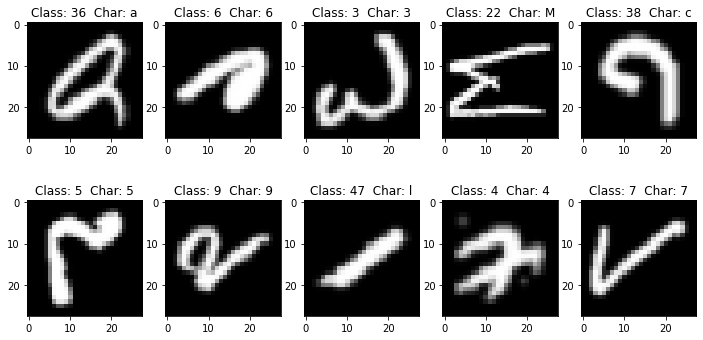

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

#display the first 10 images
for i in range(1,11):
  plt.subplot(2,5,i)
  plt.imshow(train_data[i].reshape((28,28)), cmap=plt.get_cmap('gray'))
  plt.title("Class: " + str(train_label[i]) + '  Char: ' + chr(class_char[train_label[i]][1]) )
plt.show()

# **4. Preprocessing**

**4.1 Normalisation**

In [3]:
#Normalise the data by dividing 255
train_norm=train_data/255
test_norm = test_data/255

**4.2 PCA**

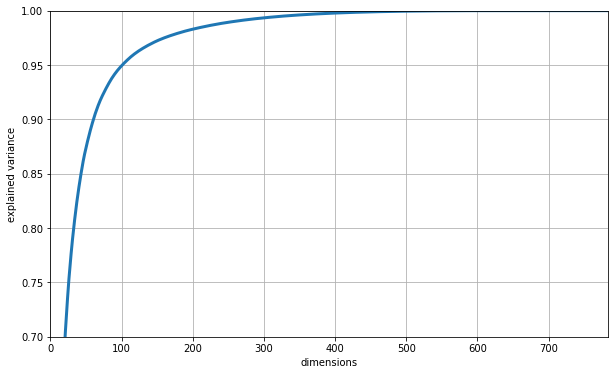

In [6]:
# Use PCA to analysis and reduce the dimension of the data
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# From com5318 lab 6
pca = PCA()
pca.fit(train_norm)
cumsum = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize = (10,6))
plt.plot(cumsum, linewidth=3)
plt.axis([0, 784, 0.7, 1])
plt.xlabel("dimensions")
plt.ylabel("explained variance")
plt.grid(True)
plt.show()

In [4]:
from sklearn.decomposition import PCA
import numpy as np

#use the first 100 pricinpal components 
pca = PCA(n_components = 100)

#fit and transform normalised train and test dataset
train_data = pca.fit_transform(train_norm)
test_data = pca.transform(test_norm)

# **5. CNN Baseline Model**

**5.1 Prepare DataLoader**

In [5]:
import torch
import torch.nn as nn
import torch.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from sklearn.metrics import precision_score, recall_score, confusion_matrix, accuracy_score

In [6]:
# Split the training data to validation data

train_data, valid_data, train_label_split, valid_label = train_test_split(train_norm,
                                      train_label,
                                      test_size=0.3)

# Convert data to image format
train_images = train_data.reshape((-1,1,28,28))
valid_iamges = valid_data.reshape((-1,1,28,28))
test_images = test_norm.reshape((-1,1,28,28))
all_images = train_norm.reshape((-1,1,28,28))

# Load the data to Dataset class
train_dataset = TensorDataset(torch.from_numpy(train_images), torch.from_numpy(train_label_split))
valid_dataset = TensorDataset(torch.from_numpy(valid_iamges), torch.from_numpy(valid_label))
test_dataset = TensorDataset(torch.from_numpy(test_images), torch.from_numpy(test_label))
all_train_dataset = TensorDataset(torch.from_numpy(all_images), torch.from_numpy(train_label))

**5.2 Baseline Model**

In [10]:
# Build a baseline CNN model

class CNN_baseline(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_baseline, self).__init__()
    self.features = nn.Sequential(
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1), #convolutional layer 1: out channels = 3, kernel size = 3, padding =1
            nn.BatchNorm2d(3),   #adding batch normalization layer
            nn.ReLU(True),   #activated by Relu funtion
        
            nn.Conv2d(3, 64, kernel_size=3, padding=1), #convolutional layer 2: out channels = 64 kernel size = 3, padding =1
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2), #using max pooling to extract features with kernel size 2, reducing from 28*28 to 14*14
        
            nn.Conv2d(64, 128, kernel_size=3, padding=1), #convolutional layer 3: out channels = 128, kernel size = 3, padding =1
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2) #using max polling to further extract features with kernel size 2, reducing from 14*14 to 7*7 
        )
    self.classifier = nn.Sequential(
            nn.Linear(128 * 7 * 7, num_classes) #one fully connected layer
        )
    
  def forward(self, x): #foward feed
    x = self.features(x)
    x = torch.flatten(x, 1) # flatten all dimensions
    x = self.classifier(x)
    return x

**5.3 Define Train Evaluation Function**

In [8]:
#define an evaluation funtion 
def train(model, epochs, criterion, optimizer, train_loader, valid_loader, device):

#evaluation metrics: loss, accuracy, precision and recall
  loss_list = []
  acc_list = []
  precision_list=[]
  recall_list=[]

  for epoch in range(epochs):
    print(f'Epoch: {epoch+1}')

    model.train()
    running_loss = 0
    print("Training:", end='')
    
    #use the tqdm library to read image and label
    for image, label in tqdm(train_loader, total=len(train_loader)):
      
      image = image.to(device).to(torch.float32)
      label = label.to(device).view(-1)
    #clean the optimizer
      optimizer.zero_grad()
      out = model(image)
    #add value to loss list
      loss = criterion(out, label)
      loss.backward()
      optimizer.step()
      running_loss += loss.item()
      
    final_loss = running_loss / len(train_loader)
    loss_list.append(final_loss)
    #add values to accuracy, precision and reall list
    model.eval()
    print("Validation:", end='')
    #test function is defined below
    acc, precision, recall = test(model, valid_loader, device)
    acc_list.append(acc)
    precision_list.append(precision)
    recall_list.append(recall)

    print(f'Loss: {final_loss:.3f}, Acc: {acc*100:.2f}%, Precision: {precision:.3f}, Recall: {recall:.3f}\n')

  return loss_list, acc_list,precision_list, recall_list

**5.4 Define Test Evaluation Function**

In [11]:
def test(model, test_loader, device):
#create y prediction list and ground truth list
  y_pred = []
  gt = []
    #Iterate through the test set minibatchs
  for image, label in tqdm(test_loader, total=len(test_loader)):
      
      image = image.to(device).to(torch.float32)
      label = label.to(device).view(-1)
      
      out = model(image)
    #predict y labels in test dataset
      predicted = torch.argmax(out, -1)
      y_pred.extend(list(predicted.cpu().numpy()))
      gt.extend(list(label.cpu().numpy()))

  #calculate accuracy score, precision score and recall score compare with ground truth labels.
  acc = accuracy_score(y_pred, gt)
  precision = precision_score(y_pred, gt, average='micro')
  recall = recall_score(y_pred, gt, average='micro')

  return acc, precision, recall

**5.5 Evaluate Baseline Model - Validation Dataset**

In [92]:
#define parameters values
#evaluate baseline model on train dataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20
batch_size = 256

#use dataloader load train, valid and test dataset, shuffle to make train data samples randomly
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#use crossentropy loss function and adam as the optimizer
CNN_baseline = CNN_baseline(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(CNN_baseline.parameters(), lr=learning_rate, weight_decay=0.0001)

loss_list = train(CNN_baseline, epochs, criterion, optimizer, train_loader, train_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 7.168, Acc: 77.65%, Precision: 0.776, Recall: 0.776

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.712, Acc: 79.68%, Precision: 0.797, Recall: 0.797

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.591, Acc: 83.05%, Precision: 0.830, Recall: 0.830

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.525, Acc: 85.00%, Precision: 0.850, Recall: 0.850

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.480, Acc: 84.27%, Precision: 0.843, Recall: 0.843

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.448, Acc: 85.04%, Precision: 0.850, Recall: 0.850

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.422, Acc: 87.45%, Precision: 0.875, Recall: 0.875

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.400, Acc: 86.95%, Precision: 0.870, Recall: 0.870

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.386, Acc: 88.25%, Precision: 0.883, Recall: 0.883

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.364, Acc: 87.36%, Precision: 0.874, Recall: 0.874

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.345, Acc: 89.68%, Precision: 0.897, Recall: 0.897

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.343, Acc: 89.75%, Precision: 0.898, Recall: 0.898

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.332, Acc: 89.73%, Precision: 0.897, Recall: 0.897

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.311, Acc: 87.50%, Precision: 0.875, Recall: 0.875

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.308, Acc: 90.25%, Precision: 0.903, Recall: 0.903

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.302, Acc: 90.85%, Precision: 0.909, Recall: 0.909

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.294, Acc: 90.02%, Precision: 0.900, Recall: 0.900

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.291, Acc: 90.54%, Precision: 0.905, Recall: 0.905

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.283, Acc: 91.37%, Precision: 0.914, Recall: 0.914

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/137 [00:00<?, ?it/s]

Loss: 0.279, Acc: 91.50%, Precision: 0.915, Recall: 0.915



In [97]:
#evaluate baseline model on validation dataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_baseline = CNN_baseline(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(CNN_baseline.parameters(), lr=learning_rate, weight_decay=0.0001)

loss_list_valid = train(CNN_baseline, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 6.072, Acc: 74.45%, Precision: 0.745, Recall: 0.745

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.719, Acc: 78.93%, Precision: 0.789, Recall: 0.789

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.598, Acc: 79.61%, Precision: 0.796, Recall: 0.796

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.527, Acc: 80.37%, Precision: 0.804, Recall: 0.804

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.483, Acc: 81.65%, Precision: 0.817, Recall: 0.817

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.455, Acc: 80.77%, Precision: 0.808, Recall: 0.808

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.419, Acc: 81.05%, Precision: 0.811, Recall: 0.811

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.400, Acc: 80.69%, Precision: 0.807, Recall: 0.807

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.393, Acc: 81.04%, Precision: 0.810, Recall: 0.810

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.364, Acc: 81.76%, Precision: 0.818, Recall: 0.818

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.352, Acc: 80.83%, Precision: 0.808, Recall: 0.808

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.341, Acc: 80.66%, Precision: 0.807, Recall: 0.807

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.327, Acc: 80.03%, Precision: 0.800, Recall: 0.800

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.317, Acc: 81.59%, Precision: 0.816, Recall: 0.816

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.309, Acc: 80.89%, Precision: 0.809, Recall: 0.809

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.297, Acc: 80.31%, Precision: 0.803, Recall: 0.803

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.299, Acc: 79.32%, Precision: 0.793, Recall: 0.793

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.290, Acc: 80.48%, Precision: 0.805, Recall: 0.805

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.278, Acc: 80.49%, Precision: 0.805, Recall: 0.805

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.278, Acc: 81.20%, Precision: 0.812, Recall: 0.812



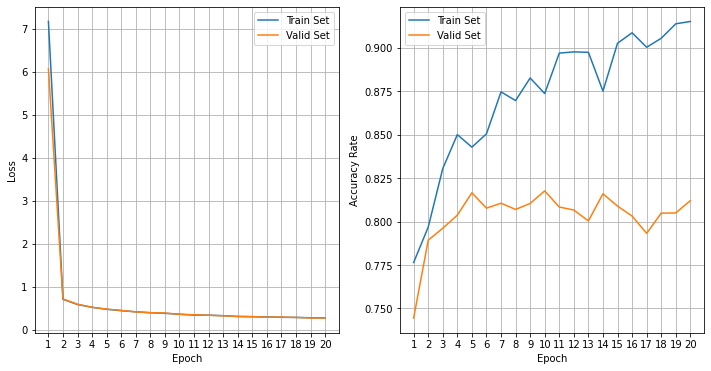

In [98]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.plot(range(1,epochs+1), loss_list[0], label = 'Train Set')
plt.plot(range(1,epochs+1), loss_list_valid[0], label = 'Valid Set')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(range(1,epochs+1), loss_list[1], label = 'Train Set')
plt.plot(range(1,epochs+1), loss_list_valid[1], label = 'Valid Set')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy Rate")

plt.show()

# **6.Fine Tune CNN**

**6.1 Fine Tune CNN by adding Convolutional Layers**

In [ ]:
# Build a CNN model with 4 convolutional layers

class CNN_4conv(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_4conv, self).__init__()
    self.features = nn.Sequential(
            #convolutional layer 1: out channels = 3, kernel size = 3, padding =1
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1),
            nn.BatchNorm2d(3),
            nn.ReLU(True),
            #convolutional layer 2: out channels = 64 kernel size = 3, padding =1
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            #using max polling to extract features with kernel size 2, reducing from 28*28 to 14*14
            nn.MaxPool2d(kernel_size=2, stride=2),
            #convolutional layer 3: out channels = 3, kernel size = 3, padding =1
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            #Add another convolutional layer 4: out channels = 256, kernel size = 3, padding = 1
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            #using max polling to further extract features with kernel size 2, reducing from 14*14 to 7*7
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
    self.classifier = nn.Sequential(
            #add to fully connected layer in_features = 256*7*7, out_features = num_classes
            nn.Linear(256 * 7 * 7, num_classes)
        )
  #forward function that defines network structure
  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

In [ ]:
# Build a CNN model with 5 convolutional layers
class CNN_5conv(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_5conv, self).__init__()
    self.features = nn.Sequential(
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1),
            nn.BatchNorm2d(3),
            nn.ReLU(True),
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Conv2d(256, 512, kernel_size=3, padding=1), #Add another convolutional layer 5: out channels = 512, kernel size = 3, padding = 1
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
    self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, num_classes)
        )
    
  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

In [ ]:
# Build a CNN model with 6 convolutional layers

class CNN_6conv(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_6conv, self).__init__()
    self.features = nn.Sequential(
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1),
            nn.BatchNorm2d(3),
            nn.ReLU(True),
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),#Add another convolutional layer 6: out channels = 512, kernel size = 3, padding = 1
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
    self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, num_classes)
        )
    
  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

In [ ]:
#evaluate 4 convolutional layers model on validation dataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_4conv = CNN_4conv(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(CNN_4conv.parameters(), lr=learning_rate, weight_decay=0.0001)

loss_list_4conv = train(CNN_4conv, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 12.301, Acc: 69.44%, Precision: 0.694, Recall: 0.694

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.875, Acc: 77.35%, Precision: 0.774, Recall: 0.774

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.646, Acc: 79.19%, Precision: 0.792, Recall: 0.792

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.567, Acc: 80.13%, Precision: 0.801, Recall: 0.801

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.513, Acc: 81.05%, Precision: 0.810, Recall: 0.810

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.485, Acc: 80.35%, Precision: 0.804, Recall: 0.804

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.450, Acc: 81.31%, Precision: 0.813, Recall: 0.813

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.428, Acc: 82.19%, Precision: 0.822, Recall: 0.822

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.402, Acc: 79.93%, Precision: 0.799, Recall: 0.799

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.390, Acc: 81.03%, Precision: 0.810, Recall: 0.810

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.385, Acc: 79.95%, Precision: 0.800, Recall: 0.800

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.381, Acc: 81.57%, Precision: 0.816, Recall: 0.816

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.363, Acc: 79.99%, Precision: 0.800, Recall: 0.800

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.350, Acc: 81.31%, Precision: 0.813, Recall: 0.813

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.354, Acc: 81.56%, Precision: 0.816, Recall: 0.816

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.331, Acc: 79.13%, Precision: 0.791, Recall: 0.791

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.328, Acc: 79.97%, Precision: 0.800, Recall: 0.800

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.317, Acc: 78.37%, Precision: 0.784, Recall: 0.784

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.310, Acc: 80.03%, Precision: 0.800, Recall: 0.800

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.312, Acc: 80.01%, Precision: 0.800, Recall: 0.800



In [ ]:
#evaluate 5 convolutional layers model on validation dataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_5conv = CNN_5conv(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(CNN_5conv.parameters(), lr=learning_rate, weight_decay=0.0001)

loss_list_5conv = train(CNN_5conv, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 17.497, Acc: 69.15%, Precision: 0.692, Recall: 0.692

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.897, Acc: 75.59%, Precision: 0.756, Recall: 0.756

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.697, Acc: 77.87%, Precision: 0.779, Recall: 0.779

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.592, Acc: 80.35%, Precision: 0.803, Recall: 0.803

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.537, Acc: 79.51%, Precision: 0.795, Recall: 0.795

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.499, Acc: 81.94%, Precision: 0.819, Recall: 0.819

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.479, Acc: 82.05%, Precision: 0.820, Recall: 0.820

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.449, Acc: 82.11%, Precision: 0.821, Recall: 0.821

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.430, Acc: 81.69%, Precision: 0.817, Recall: 0.817

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.418, Acc: 78.17%, Precision: 0.782, Recall: 0.782

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.413, Acc: 77.21%, Precision: 0.772, Recall: 0.772

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.405, Acc: 81.88%, Precision: 0.819, Recall: 0.819

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.401, Acc: 79.73%, Precision: 0.797, Recall: 0.797

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.392, Acc: 81.59%, Precision: 0.816, Recall: 0.816

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.382, Acc: 79.63%, Precision: 0.796, Recall: 0.796

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.375, Acc: 81.63%, Precision: 0.816, Recall: 0.816

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.354, Acc: 81.77%, Precision: 0.818, Recall: 0.818

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.367, Acc: 81.03%, Precision: 0.810, Recall: 0.810

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.337, Acc: 79.71%, Precision: 0.797, Recall: 0.797

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.329, Acc: 75.76%, Precision: 0.758, Recall: 0.758



In [ ]:
#evaluate 6 convolutional layers model on validation dataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_6conv = CNN_6conv(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(CNN_6conv.parameters(), lr=learning_rate, weight_decay=0.0001)

loss_list_6conv = train(CNN_6conv, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 19.348, Acc: 70.87%, Precision: 0.709, Recall: 0.709

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.862, Acc: 76.14%, Precision: 0.761, Recall: 0.761

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.674, Acc: 76.84%, Precision: 0.768, Recall: 0.768

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.597, Acc: 79.13%, Precision: 0.791, Recall: 0.791

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.547, Acc: 80.60%, Precision: 0.806, Recall: 0.806

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.510, Acc: 80.67%, Precision: 0.807, Recall: 0.807

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.483, Acc: 80.92%, Precision: 0.809, Recall: 0.809

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.480, Acc: 81.57%, Precision: 0.816, Recall: 0.816

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.451, Acc: 80.85%, Precision: 0.808, Recall: 0.808

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.470, Acc: 81.24%, Precision: 0.812, Recall: 0.812

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.434, Acc: 80.11%, Precision: 0.801, Recall: 0.801

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.430, Acc: 76.79%, Precision: 0.768, Recall: 0.768

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.434, Acc: 82.50%, Precision: 0.825, Recall: 0.825

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.426, Acc: 78.99%, Precision: 0.790, Recall: 0.790

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.425, Acc: 82.41%, Precision: 0.824, Recall: 0.824

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.405, Acc: 80.56%, Precision: 0.806, Recall: 0.806

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.389, Acc: 72.67%, Precision: 0.727, Recall: 0.727

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.436, Acc: 82.23%, Precision: 0.822, Recall: 0.822

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.375, Acc: 74.73%, Precision: 0.747, Recall: 0.747

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.424, Acc: 81.26%, Precision: 0.813, Recall: 0.813



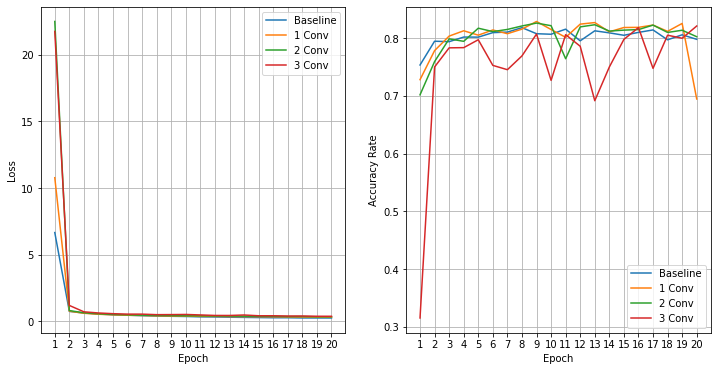

In [ ]:
#plot each epoch's loss and accuracy for baseline model, one more convolutional model, two more convolutional layer model and three more model
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.plot(range(1,epochs+1), loss_list[0], label = 'Baseline')
plt.plot(range(1,epochs+1), loss_list_1_conv[0], label = '1 Conv')
plt.plot(range(1,epochs+1), loss_list_2_conv[0], label = '2 Conv')
plt.plot(range(1,epochs+1), loss_list_3_conv[0], label = '3 Conv')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(range(1,epochs+1), loss_list[1], label = 'Baseline')
plt.plot(range(1,epochs+1), loss_list_1_conv[1], label = '1 Conv')
plt.plot(range(1,epochs+1), loss_list_2_conv[1], label = '2 Conv')
plt.plot(range(1,epochs+1), loss_list_3_conv[1], label = '3 Conv')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy Rate")

plt.show()

**6.2 Fine Tune CNN by Changing Optimizers**

In [ ]:
#evaluate 4 convolutional layers model on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#use the 4 convolutional layers model and change optimizer to SGD with momentum =0.9
CNN_4conv = CNN_4conv(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(CNN_4conv.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_3_conv = train(CNN_4conv, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 3.590, Acc: 71.57%, Precision: 0.716, Recall: 0.716

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.769, Acc: 76.97%, Precision: 0.770, Recall: 0.770

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.631, Acc: 79.09%, Precision: 0.791, Recall: 0.791

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.564, Acc: 81.59%, Precision: 0.816, Recall: 0.816

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.513, Acc: 81.79%, Precision: 0.818, Recall: 0.818

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.481, Acc: 82.37%, Precision: 0.824, Recall: 0.824

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.463, Acc: 82.75%, Precision: 0.827, Recall: 0.827

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.433, Acc: 81.98%, Precision: 0.820, Recall: 0.820

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.410, Acc: 83.00%, Precision: 0.830, Recall: 0.830

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.387, Acc: 82.48%, Precision: 0.825, Recall: 0.825

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.392, Acc: 83.00%, Precision: 0.830, Recall: 0.830

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.361, Acc: 83.60%, Precision: 0.836, Recall: 0.836

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.342, Acc: 82.41%, Precision: 0.824, Recall: 0.824

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.334, Acc: 81.03%, Precision: 0.810, Recall: 0.810

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.322, Acc: 83.03%, Precision: 0.830, Recall: 0.830

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.309, Acc: 83.81%, Precision: 0.838, Recall: 0.838

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.304, Acc: 82.75%, Precision: 0.827, Recall: 0.827

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.280, Acc: 83.19%, Precision: 0.832, Recall: 0.832

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.274, Acc: 82.74%, Precision: 0.827, Recall: 0.827

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.265, Acc: 80.47%, Precision: 0.805, Recall: 0.805



In [ ]:
#evaluate 5 convolutional layers model on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_Adamax = CNN_4conv(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adamax(CNN_Adamax.parameters(), lr=learning_rate,  weight_decay=0.0001)

loss_list_4_Adamax = train(CNN_Adamax, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 8.867, Acc: 68.81%, Precision: 0.688, Recall: 0.688

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.939, Acc: 77.21%, Precision: 0.772, Recall: 0.772

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.702, Acc: 78.29%, Precision: 0.783, Recall: 0.783

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.608, Acc: 80.43%, Precision: 0.804, Recall: 0.804

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.552, Acc: 80.80%, Precision: 0.808, Recall: 0.808

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.512, Acc: 78.73%, Precision: 0.787, Recall: 0.787

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.477, Acc: 81.66%, Precision: 0.817, Recall: 0.817

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.455, Acc: 80.11%, Precision: 0.801, Recall: 0.801

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.429, Acc: 81.59%, Precision: 0.816, Recall: 0.816

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.401, Acc: 82.29%, Precision: 0.823, Recall: 0.823

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.377, Acc: 82.13%, Precision: 0.821, Recall: 0.821

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.370, Acc: 80.85%, Precision: 0.809, Recall: 0.809

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.351, Acc: 81.91%, Precision: 0.819, Recall: 0.819

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.326, Acc: 82.66%, Precision: 0.827, Recall: 0.827

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.325, Acc: 81.79%, Precision: 0.818, Recall: 0.818

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.307, Acc: 82.82%, Precision: 0.828, Recall: 0.828

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.293, Acc: 82.17%, Precision: 0.822, Recall: 0.822

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.277, Acc: 82.15%, Precision: 0.822, Recall: 0.822

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.276, Acc: 81.47%, Precision: 0.815, Recall: 0.815

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.256, Acc: 82.59%, Precision: 0.826, Recall: 0.826



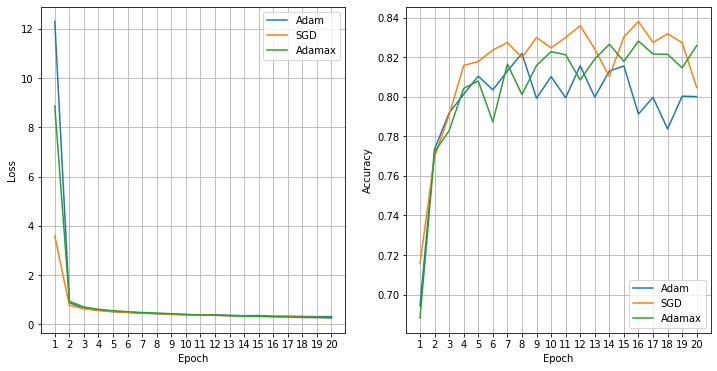

In [ ]:
#plot each epoch's loss and accuracy using different optimizers
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.plot(range(1,epochs+1), loss_list_4conv[0], label = 'Adam')
plt.plot(range(1,epochs+1), loss_list_3_conv[0], label = 'SGD')
plt.plot(range(1,epochs+1), loss_list_4_Adamax[0], label = 'Adamax')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(range(1,epochs+1), loss_list_4conv[1], label = 'Adam')
plt.plot(range(1,epochs+1), loss_list_3_conv[1], label = 'SGD')
plt.plot(range(1,epochs+1), loss_list_4_Adamax[1], label = 'Adamax')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

**6.3 Fine Tune CNN by adding linear layers**

In [ ]:
# Build a CNN model with 2 linear layers

class CNN_2linear(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_2linear, self).__init__()
    self.features = nn.Sequential(
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1),
            nn.BatchNorm2d(3),
            nn.ReLU(True),
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
    self.classifier = nn.Sequential(
            nn.Linear(256 * 7 * 7, 4096), #add one more fully connected layer in_features = 256*7*7, out_features = 4096
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, num_classes)
        )
    
  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

In [12]:
# Build a CNN model with 3 linear layers

class CNN_3linear(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_3linear, self).__init__()
    self.features = nn.Sequential(
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1),
            nn.BatchNorm2d(3),
            nn.ReLU(True),
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
    self.classifier = nn.Sequential(
            nn.Linear(256 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),#add another fully connected layer in_features = 4096, out_features = 4096
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, num_classes)
        )
    
  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

In [ ]:
#evaluate 4 convolutional layers 2 linear layers model on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#use 2 linear layers model and sgd optimizer
CNN_2linear = CNN_2linear(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(CNN_2linear.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_2linear = train(CNN_2linear, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 1.119, Acc: 78.79%, Precision: 0.788, Recall: 0.788

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.553, Acc: 81.59%, Precision: 0.816, Recall: 0.816

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.467, Acc: 82.55%, Precision: 0.825, Recall: 0.825

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.424, Acc: 83.43%, Precision: 0.834, Recall: 0.834

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.384, Acc: 83.51%, Precision: 0.835, Recall: 0.835

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.353, Acc: 81.90%, Precision: 0.819, Recall: 0.819

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.327, Acc: 84.55%, Precision: 0.845, Recall: 0.845

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.303, Acc: 84.15%, Precision: 0.842, Recall: 0.842

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.282, Acc: 84.22%, Precision: 0.842, Recall: 0.842

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.261, Acc: 84.43%, Precision: 0.844, Recall: 0.844

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.243, Acc: 82.75%, Precision: 0.828, Recall: 0.828

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.227, Acc: 84.02%, Precision: 0.840, Recall: 0.840

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.210, Acc: 84.10%, Precision: 0.841, Recall: 0.841

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.187, Acc: 83.55%, Precision: 0.836, Recall: 0.836

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.175, Acc: 83.68%, Precision: 0.837, Recall: 0.837

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.165, Acc: 83.59%, Precision: 0.836, Recall: 0.836

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.150, Acc: 83.29%, Precision: 0.833, Recall: 0.833

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.137, Acc: 83.30%, Precision: 0.833, Recall: 0.833

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.128, Acc: 83.06%, Precision: 0.831, Recall: 0.831

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.120, Acc: 83.39%, Precision: 0.834, Recall: 0.834



In [11]:
#evaluate 4 convolutional layers 3 linear layers model on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#use 3 linear layers and sgd optimizer
CNN_3linear = CNN_3linear(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(CNN_3linear.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_3linear = train(CNN_3linear, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 1.366, Acc: 77.47%, Precision: 0.775, Recall: 0.775

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.586, Acc: 82.02%, Precision: 0.820, Recall: 0.820

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.490, Acc: 81.82%, Precision: 0.818, Recall: 0.818

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.441, Acc: 83.03%, Precision: 0.830, Recall: 0.830

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.405, Acc: 83.56%, Precision: 0.836, Recall: 0.836

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.376, Acc: 81.61%, Precision: 0.816, Recall: 0.816

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.353, Acc: 83.73%, Precision: 0.837, Recall: 0.837

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.335, Acc: 83.09%, Precision: 0.831, Recall: 0.831

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.312, Acc: 84.14%, Precision: 0.841, Recall: 0.841

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.295, Acc: 84.44%, Precision: 0.844, Recall: 0.844

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.276, Acc: 84.34%, Precision: 0.843, Recall: 0.843

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.262, Acc: 83.33%, Precision: 0.833, Recall: 0.833

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.246, Acc: 83.81%, Precision: 0.838, Recall: 0.838

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.234, Acc: 84.13%, Precision: 0.841, Recall: 0.841

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.218, Acc: 84.55%, Precision: 0.845, Recall: 0.845

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.207, Acc: 83.64%, Precision: 0.836, Recall: 0.836

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.191, Acc: 82.61%, Precision: 0.826, Recall: 0.826

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.184, Acc: 83.55%, Precision: 0.835, Recall: 0.835

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.167, Acc: 83.18%, Precision: 0.832, Recall: 0.832

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.160, Acc: 83.45%, Precision: 0.835, Recall: 0.835



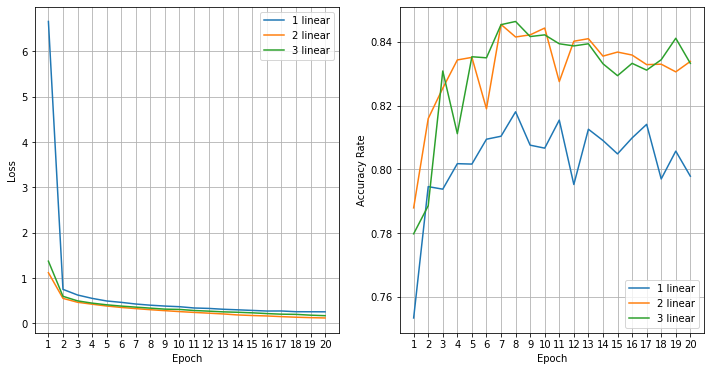

In [ ]:
#plot each ploch's loss and accuracy for one linear layer, two and three linear layers models
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.plot(range(1,epochs+1), loss_list[0], label = '1 linear')
plt.plot(range(1,epochs+1), loss_list_2linear[0], label = '2 linear')
plt.plot(range(1,epochs+1), loss_list_3linear[0], label = '3 linear')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(range(1,epochs+1), loss_list[1], label = '1 linear')
plt.plot(range(1,epochs+1), loss_list_2linear[1], label = '2 linear')
plt.plot(range(1,epochs+1), loss_list_3linear[1], label = '3 linear')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy Rate")

plt.show()

**6.4 Fine Tune CNN without BN**

In [12]:
#Use the same model structure as CNN_3linear but dropping the batch normalization layer

class CNN_without_BN(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_without_BN, self).__init__()
    self.features = nn.Sequential(
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1),
            nn.ReLU(True),
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
    self.classifier = nn.Sequential(
            nn.Linear(256 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, num_classes)
        )
    
  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

In [13]:
#evaluate 4 convolutional layers 2 linear layers model without batch normalisation layer on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 256
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#calculate scores using the no batch normalization layer model and sgd optimizer
cnn_without_bn = CNN_without_BN(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(cnn_without_bn.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_without_bn = train(cnn_without_bn, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 3.824, Acc: 8.33%, Precision: 0.083, Recall: 0.083

Epoch: 2
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 2.137, Acc: 65.77%, Precision: 0.658, Recall: 0.658

Epoch: 3
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.990, Acc: 72.16%, Precision: 0.722, Recall: 0.722

Epoch: 4
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.748, Acc: 76.86%, Precision: 0.769, Recall: 0.769

Epoch: 5
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.624, Acc: 79.47%, Precision: 0.795, Recall: 0.795

Epoch: 6
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.547, Acc: 80.37%, Precision: 0.804, Recall: 0.804

Epoch: 7
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.498, Acc: 81.37%, Precision: 0.814, Recall: 0.814

Epoch: 8
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.462, Acc: 81.51%, Precision: 0.815, Recall: 0.815

Epoch: 9
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.433, Acc: 82.60%, Precision: 0.826, Recall: 0.826

Epoch: 10
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.406, Acc: 82.51%, Precision: 0.825, Recall: 0.825

Epoch: 11
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.383, Acc: 82.44%, Precision: 0.824, Recall: 0.824

Epoch: 12
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.368, Acc: 82.78%, Precision: 0.828, Recall: 0.828

Epoch: 13
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.344, Acc: 82.81%, Precision: 0.828, Recall: 0.828

Epoch: 14
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.328, Acc: 82.83%, Precision: 0.828, Recall: 0.828

Epoch: 15
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.312, Acc: 82.63%, Precision: 0.826, Recall: 0.826

Epoch: 16
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.299, Acc: 83.06%, Precision: 0.831, Recall: 0.831

Epoch: 17
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.282, Acc: 82.29%, Precision: 0.823, Recall: 0.823

Epoch: 18
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.275, Acc: 82.65%, Precision: 0.827, Recall: 0.827

Epoch: 19
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.260, Acc: 82.37%, Precision: 0.824, Recall: 0.824

Epoch: 20
Training:

  0%|          | 0/137 [00:00<?, ?it/s]

Validation:

  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.253, Acc: 82.85%, Precision: 0.828, Recall: 0.828



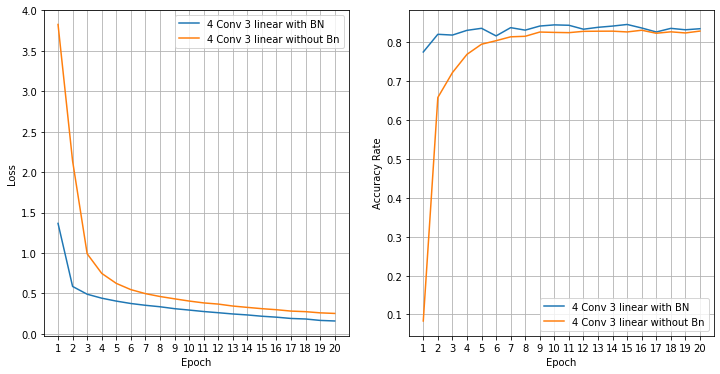

In [16]:
#plot the loss and accuracy in each poch for model with and without batch normalization
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.plot(range(1,epochs+1), loss_list_3linear[0], label = '4 Conv 3 linear with BN')
plt.plot(range(1,epochs+1), loss_list_without_bn[0], label = '4 Conv 3 linear without Bn')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(range(1,epochs+1), loss_list_3linear[1], label = '4 Conv 3 linear with BN')
plt.plot(range(1,epochs+1), loss_list_without_bn[1], label = '4 Conv 3 linear without Bn')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy Rate")

plt.show()

**6.5 Fine Tune CNN by Different Batch Size**

In [14]:
#from this step, after tunings will use the CNN_3linear architechture testing valid_loader
#evaluate batch size 128 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

#change the batch size to 128
batch_size = 128
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_BS128 = CNN_3linear(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optimizer = optim.SGD(CNN_BS128.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_128 = train(CNN_BS128, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.084, Acc: 77.96%, Precision: 0.780, Recall: 0.780

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.540, Acc: 82.79%, Precision: 0.828, Recall: 0.828

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.470, Acc: 84.13%, Precision: 0.841, Recall: 0.841

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.418, Acc: 83.12%, Precision: 0.831, Recall: 0.831

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.393, Acc: 82.94%, Precision: 0.829, Recall: 0.829

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.364, Acc: 84.23%, Precision: 0.842, Recall: 0.842

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.339, Acc: 84.35%, Precision: 0.844, Recall: 0.844

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.315, Acc: 83.47%, Precision: 0.835, Recall: 0.835

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.299, Acc: 83.73%, Precision: 0.837, Recall: 0.837

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.282, Acc: 83.24%, Precision: 0.832, Recall: 0.832

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.268, Acc: 84.90%, Precision: 0.849, Recall: 0.849

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.251, Acc: 83.85%, Precision: 0.838, Recall: 0.838

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.237, Acc: 84.20%, Precision: 0.842, Recall: 0.842

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.222, Acc: 83.77%, Precision: 0.838, Recall: 0.838

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.209, Acc: 84.09%, Precision: 0.841, Recall: 0.841

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.201, Acc: 83.93%, Precision: 0.839, Recall: 0.839

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.190, Acc: 83.27%, Precision: 0.833, Recall: 0.833

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.178, Acc: 83.19%, Precision: 0.832, Recall: 0.832

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.169, Acc: 82.22%, Precision: 0.822, Recall: 0.822

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.156, Acc: 84.01%, Precision: 0.840, Recall: 0.840



In [ ]:
#evaluate batch size 512 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

#change the batch size to 512
batch_size = 512
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_BS512 = CNN_3linear(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optimizer = optim.SGD(CNN_BS512.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_512 = train(CNN_BS512, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 1.859, Acc: 74.22%, Precision: 0.742, Recall: 0.742

Epoch: 2
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.720, Acc: 78.35%, Precision: 0.783, Recall: 0.783

Epoch: 3
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.570, Acc: 79.88%, Precision: 0.799, Recall: 0.799

Epoch: 4
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.514, Acc: 81.59%, Precision: 0.816, Recall: 0.816

Epoch: 5
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.466, Acc: 83.39%, Precision: 0.834, Recall: 0.834

Epoch: 6
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.430, Acc: 83.09%, Precision: 0.831, Recall: 0.831

Epoch: 7
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.413, Acc: 84.19%, Precision: 0.842, Recall: 0.842

Epoch: 8
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.388, Acc: 84.18%, Precision: 0.842, Recall: 0.842

Epoch: 9
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.365, Acc: 84.19%, Precision: 0.842, Recall: 0.842

Epoch: 10
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.351, Acc: 83.57%, Precision: 0.836, Recall: 0.836

Epoch: 11
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.335, Acc: 84.29%, Precision: 0.843, Recall: 0.843

Epoch: 12
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.322, Acc: 84.37%, Precision: 0.844, Recall: 0.844

Epoch: 13
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.300, Acc: 84.10%, Precision: 0.841, Recall: 0.841

Epoch: 14
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.294, Acc: 82.66%, Precision: 0.827, Recall: 0.827

Epoch: 15
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.281, Acc: 83.71%, Precision: 0.837, Recall: 0.837

Epoch: 16
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.266, Acc: 84.21%, Precision: 0.842, Recall: 0.842

Epoch: 17
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.250, Acc: 83.95%, Precision: 0.839, Recall: 0.839

Epoch: 18
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.249, Acc: 84.54%, Precision: 0.845, Recall: 0.845

Epoch: 19
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.231, Acc: 83.36%, Precision: 0.834, Recall: 0.834

Epoch: 20
Training:

  0%|          | 0/69 [00:00<?, ?it/s]

Validation:

  0%|          | 0/30 [00:00<?, ?it/s]

Loss: 0.229, Acc: 84.31%, Precision: 0.843, Recall: 0.843



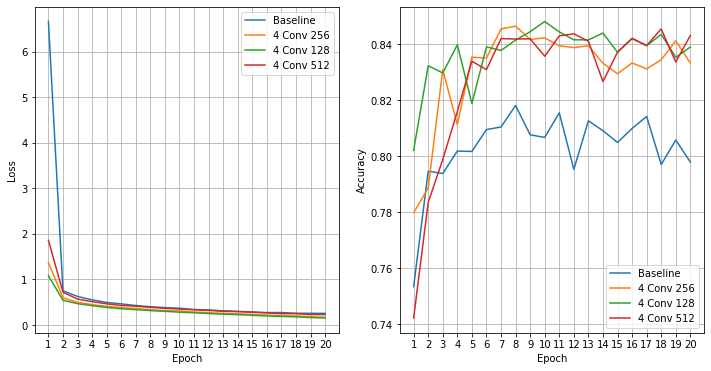

In [ ]:
#plot the result for different batch sizes
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.plot(range(1,epochs+1), loss_list[0], label = 'Baseline')
plt.plot(range(1,epochs+1), loss_list_3linear[0], label = '4 Conv 256')
plt.plot(range(1,epochs+1), loss_list_128[0], label = '4 Conv 128')
plt.plot(range(1,epochs+1), loss_list_512[0], label = '4 Conv 512')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(range(1,epochs+1), loss_list[1], label = 'Baseline')
plt.plot(range(1,epochs+1), loss_list_3linear[1], label = '4 Conv 256')
plt.plot(range(1,epochs+1), loss_list_128[1], label = '4 Conv 128')
plt.plot(range(1,epochs+1), loss_list_512[1], label = '4 Conv 512')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

**6.6 Fine Tune CNN by Changing Learning Rate**

In [ ]:
#evaluate learning rate 0.001 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.001  #change the learning rate from 0.01 to 0.001
epochs = 20

batch_size = 128
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_lr2 = CNN_3linear(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optimizer = optim.SGD(CNN_lr2.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_lr2 = train(CNN_lr2, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 2.096, Acc: 68.32%, Precision: 0.683, Recall: 0.683

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.923, Acc: 76.58%, Precision: 0.766, Recall: 0.766

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.710, Acc: 79.15%, Precision: 0.791, Recall: 0.791

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.614, Acc: 80.85%, Precision: 0.808, Recall: 0.808

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.557, Acc: 81.55%, Precision: 0.816, Recall: 0.816

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.520, Acc: 81.63%, Precision: 0.816, Recall: 0.816

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.489, Acc: 82.62%, Precision: 0.826, Recall: 0.826

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.465, Acc: 83.45%, Precision: 0.835, Recall: 0.835

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.444, Acc: 83.61%, Precision: 0.836, Recall: 0.836

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.430, Acc: 83.46%, Precision: 0.835, Recall: 0.835

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.413, Acc: 84.09%, Precision: 0.841, Recall: 0.841

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.400, Acc: 83.66%, Precision: 0.837, Recall: 0.837

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.389, Acc: 82.53%, Precision: 0.825, Recall: 0.825

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.373, Acc: 83.59%, Precision: 0.836, Recall: 0.836

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.365, Acc: 83.89%, Precision: 0.839, Recall: 0.839

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.353, Acc: 84.11%, Precision: 0.841, Recall: 0.841

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.342, Acc: 82.64%, Precision: 0.826, Recall: 0.826

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.334, Acc: 84.05%, Precision: 0.840, Recall: 0.840

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.324, Acc: 84.57%, Precision: 0.846, Recall: 0.846

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.316, Acc: 83.60%, Precision: 0.836, Recall: 0.836



In [ ]:
#evaluate learning rate 0.1 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.1 #change the learning rate from 0.01 to 0.1
epochs = 20

batch_size = 128
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_lr3 = CNN_3linear(in_channels, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(CNN_lr3.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_lr3 = train(CNN_lr3, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.526, Acc: 77.94%, Precision: 0.779, Recall: 0.779

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.660, Acc: 80.99%, Precision: 0.810, Recall: 0.810

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.536, Acc: 83.16%, Precision: 0.832, Recall: 0.832

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.481, Acc: 81.68%, Precision: 0.817, Recall: 0.817

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.438, Acc: 83.71%, Precision: 0.837, Recall: 0.837

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.400, Acc: 84.38%, Precision: 0.844, Recall: 0.844

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.371, Acc: 84.36%, Precision: 0.844, Recall: 0.844

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.357, Acc: 84.73%, Precision: 0.847, Recall: 0.847

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.334, Acc: 84.31%, Precision: 0.843, Recall: 0.843

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.318, Acc: 84.19%, Precision: 0.842, Recall: 0.842

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.305, Acc: 83.19%, Precision: 0.832, Recall: 0.832

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.286, Acc: 83.55%, Precision: 0.835, Recall: 0.835

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.278, Acc: 84.67%, Precision: 0.847, Recall: 0.847

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.263, Acc: 83.89%, Precision: 0.839, Recall: 0.839

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.251, Acc: 84.22%, Precision: 0.842, Recall: 0.842

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.237, Acc: 82.51%, Precision: 0.825, Recall: 0.825

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.229, Acc: 83.66%, Precision: 0.837, Recall: 0.837

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.217, Acc: 84.15%, Precision: 0.841, Recall: 0.841

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.207, Acc: 83.16%, Precision: 0.832, Recall: 0.832

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.194, Acc: 83.29%, Precision: 0.833, Recall: 0.833



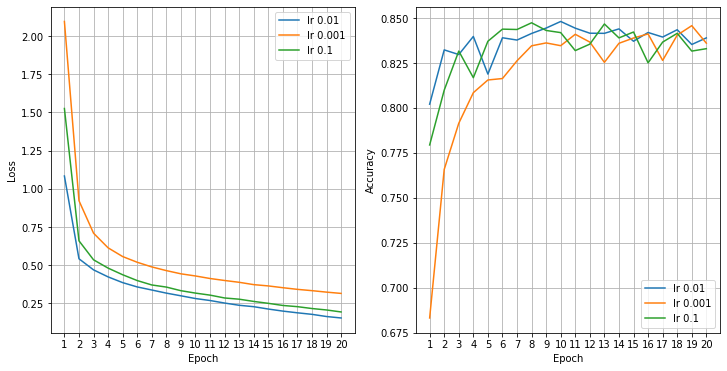

In [ ]:
#plot the result using different learning rate
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)

plt.plot(range(1,epochs+1), loss_list_128[0], label = 'lr 0.01')
plt.plot(range(1,epochs+1), loss_list_lr2[0], label = 'lr 0.001')
plt.plot(range(1,epochs+1), loss_list_lr3[0], label = 'lr 0.1')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)

plt.plot(range(1,epochs+1), loss_list_128[1], label = 'lr 0.01')
plt.plot(range(1,epochs+1), loss_list_lr2[1], label = 'lr 0.001')
plt.plot(range(1,epochs+1), loss_list_lr3[1], label = 'lr 0.1')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

**6.7 Fine Tune by Changing Dropout**

In [15]:
#evaluate dropout rate 0.5 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#change the dropout from 0.2 to 0.5
CNN_dropout = CNN_3linear(in_channels, num_classes,dropout=0.5).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(CNN_dropout.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_CNN_dropout= train(CNN_dropout, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.261, Acc: 74.62%, Precision: 0.746, Recall: 0.746

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.648, Acc: 81.60%, Precision: 0.816, Recall: 0.816

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.566, Acc: 82.39%, Precision: 0.824, Recall: 0.824

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.509, Acc: 82.26%, Precision: 0.823, Recall: 0.823

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.473, Acc: 83.85%, Precision: 0.838, Recall: 0.838

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.447, Acc: 83.54%, Precision: 0.835, Recall: 0.835

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.423, Acc: 84.81%, Precision: 0.848, Recall: 0.848

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.403, Acc: 85.00%, Precision: 0.850, Recall: 0.850

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.388, Acc: 83.53%, Precision: 0.835, Recall: 0.835

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.376, Acc: 85.19%, Precision: 0.852, Recall: 0.852

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.356, Acc: 84.25%, Precision: 0.843, Recall: 0.843

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.351, Acc: 84.93%, Precision: 0.849, Recall: 0.849

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.336, Acc: 84.97%, Precision: 0.850, Recall: 0.850

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.323, Acc: 84.49%, Precision: 0.845, Recall: 0.845

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.317, Acc: 85.07%, Precision: 0.851, Recall: 0.851

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.305, Acc: 84.44%, Precision: 0.844, Recall: 0.844

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.295, Acc: 84.79%, Precision: 0.848, Recall: 0.848

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.287, Acc: 85.31%, Precision: 0.853, Recall: 0.853

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.279, Acc: 84.75%, Precision: 0.848, Recall: 0.848

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.267, Acc: 84.79%, Precision: 0.848, Recall: 0.848



In [16]:
#evaluate dropout rate 0.7 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#change the dropout from 0.2 to 0.7
CNN_dropout2 = CNN_3linear(in_channels, num_classes,dropout=0.7).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(CNN_dropout2.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_CNN_dropout2= train(CNN_dropout2, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.703, Acc: 75.12%, Precision: 0.751, Recall: 0.751

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.929, Acc: 79.97%, Precision: 0.800, Recall: 0.800

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.797, Acc: 82.03%, Precision: 0.820, Recall: 0.820

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.718, Acc: 80.87%, Precision: 0.809, Recall: 0.809

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.663, Acc: 82.23%, Precision: 0.822, Recall: 0.822

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.622, Acc: 82.09%, Precision: 0.821, Recall: 0.821

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.576, Acc: 82.33%, Precision: 0.823, Recall: 0.823

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.555, Acc: 83.83%, Precision: 0.838, Recall: 0.838

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.535, Acc: 82.77%, Precision: 0.828, Recall: 0.828

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.511, Acc: 84.05%, Precision: 0.840, Recall: 0.840

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.496, Acc: 84.08%, Precision: 0.841, Recall: 0.841

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.476, Acc: 84.48%, Precision: 0.845, Recall: 0.845

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.462, Acc: 84.43%, Precision: 0.844, Recall: 0.844

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.449, Acc: 84.95%, Precision: 0.850, Recall: 0.850

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.438, Acc: 85.01%, Precision: 0.850, Recall: 0.850

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.422, Acc: 84.75%, Precision: 0.847, Recall: 0.847

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.413, Acc: 84.40%, Precision: 0.844, Recall: 0.844

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.409, Acc: 85.20%, Precision: 0.852, Recall: 0.852

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.396, Acc: 84.60%, Precision: 0.846, Recall: 0.846

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.390, Acc: 85.40%, Precision: 0.854, Recall: 0.854



In [17]:
#evaluate dropout rate 0.35 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#change the dropout from 0.2 to 0.35
CNN_dropout3 = CNN_3linear(in_channels, num_classes,dropout=0.35).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(CNN_dropout3.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0001)

loss_list_CNN_dropout3= train(CNN_dropout3, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.173, Acc: 79.69%, Precision: 0.797, Recall: 0.797

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.588, Acc: 82.47%, Precision: 0.825, Recall: 0.825

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.502, Acc: 82.68%, Precision: 0.827, Recall: 0.827

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.457, Acc: 82.97%, Precision: 0.830, Recall: 0.830

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.424, Acc: 83.30%, Precision: 0.833, Recall: 0.833

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.397, Acc: 84.52%, Precision: 0.845, Recall: 0.845

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.375, Acc: 84.31%, Precision: 0.843, Recall: 0.843

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.350, Acc: 84.35%, Precision: 0.844, Recall: 0.844

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.336, Acc: 84.74%, Precision: 0.847, Recall: 0.847

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.321, Acc: 83.95%, Precision: 0.840, Recall: 0.840

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.308, Acc: 83.57%, Precision: 0.836, Recall: 0.836

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.291, Acc: 83.75%, Precision: 0.837, Recall: 0.837

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.282, Acc: 84.33%, Precision: 0.843, Recall: 0.843

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.268, Acc: 84.89%, Precision: 0.849, Recall: 0.849

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.258, Acc: 84.77%, Precision: 0.848, Recall: 0.848

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.241, Acc: 83.75%, Precision: 0.838, Recall: 0.838

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.230, Acc: 84.59%, Precision: 0.846, Recall: 0.846

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.224, Acc: 84.55%, Precision: 0.845, Recall: 0.845

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.215, Acc: 83.79%, Precision: 0.838, Recall: 0.838

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.202, Acc: 84.44%, Precision: 0.844, Recall: 0.844



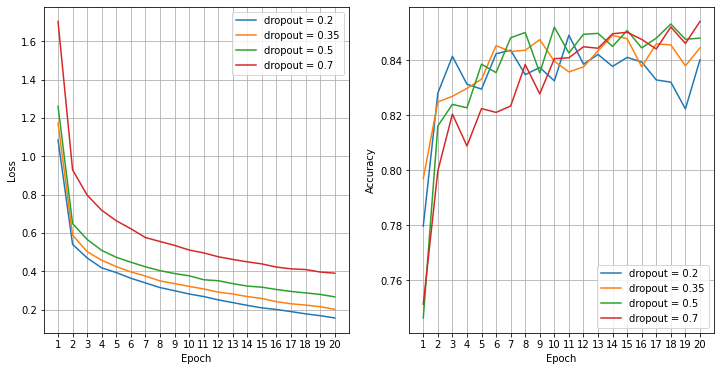

In [18]:
#plot the result using different dropout ratios
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)

plt.plot(range(1,epochs+1), loss_list_128[0], label = 'dropout = 0.2')
plt.plot(range(1,epochs+1), loss_list_CNN_dropout3[0], label = 'dropout = 0.35')
plt.plot(range(1,epochs+1), loss_list_CNN_dropout[0], label = 'dropout = 0.5')
plt.plot(range(1,epochs+1), loss_list_CNN_dropout2[0], label = 'dropout = 0.7')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)

plt.plot(range(1,epochs+1), loss_list_128[1], label = 'dropout = 0.2')
plt.plot(range(1,epochs+1), loss_list_CNN_dropout3[1], label = 'dropout = 0.35')
plt.plot(range(1,epochs+1), loss_list_CNN_dropout[1], label = 'dropout = 0.5')
plt.plot(range(1,epochs+1), loss_list_CNN_dropout2[1], label = 'dropout = 0.7')

plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

**6.8 CNN Fine Tune by Changing momentum**

In [20]:
#evaluate momentum 0.95 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_momentum2 = CNN_3linear(in_channels, num_classes,dropout=0.7).to(device)
criterion = nn.CrossEntropyLoss()
#change the momentum rate from 0.9 to 0.95
optimizer = optim.SGD(CNN_momentum2.parameters(), lr=learning_rate, momentum=0.95, weight_decay=0.0001)

loss_list_CNN_momentum2= train(CNN_momentum2, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.936, Acc: 70.43%, Precision: 0.704, Recall: 0.704

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.328, Acc: 76.81%, Precision: 0.768, Recall: 0.768

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.011, Acc: 80.36%, Precision: 0.804, Recall: 0.804

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.805, Acc: 81.65%, Precision: 0.816, Recall: 0.816

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.700, Acc: 82.38%, Precision: 0.824, Recall: 0.824

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.626, Acc: 83.33%, Precision: 0.833, Recall: 0.833

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.589, Acc: 83.53%, Precision: 0.835, Recall: 0.835

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.550, Acc: 84.32%, Precision: 0.843, Recall: 0.843

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.521, Acc: 84.29%, Precision: 0.843, Recall: 0.843

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.496, Acc: 84.51%, Precision: 0.845, Recall: 0.845

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.474, Acc: 84.49%, Precision: 0.845, Recall: 0.845

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.463, Acc: 84.73%, Precision: 0.847, Recall: 0.847

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.442, Acc: 85.28%, Precision: 0.853, Recall: 0.853

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.425, Acc: 85.29%, Precision: 0.853, Recall: 0.853

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.416, Acc: 85.19%, Precision: 0.852, Recall: 0.852

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.402, Acc: 85.21%, Precision: 0.852, Recall: 0.852

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.390, Acc: 85.30%, Precision: 0.853, Recall: 0.853

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.379, Acc: 85.34%, Precision: 0.853, Recall: 0.853

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.367, Acc: 85.35%, Precision: 0.854, Recall: 0.854

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.354, Acc: 85.65%, Precision: 0.856, Recall: 0.856



In [22]:
#evaluate momentum 0.99 on validation dataset using sgd optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

CNN_momentum3 = CNN_3linear(in_channels, num_classes,dropout=0.7).to(device)
criterion = nn.CrossEntropyLoss()
#change the momentum rate from 0.9 to 0.99
optimizer = optim.SGD(CNN_momentum3.parameters(), lr=learning_rate, momentum=0.99, weight_decay=0.0001)

loss_list_CNN_momentum3= train(CNN_momentum3, epochs, criterion, optimizer, train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 2.528, Acc: 67.55%, Precision: 0.676, Recall: 0.676

Epoch: 2
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.372, Acc: 74.21%, Precision: 0.742, Recall: 0.742

Epoch: 3
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.026, Acc: 78.39%, Precision: 0.784, Recall: 0.784

Epoch: 4
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.880, Acc: 79.43%, Precision: 0.794, Recall: 0.794

Epoch: 5
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.824, Acc: 80.87%, Precision: 0.809, Recall: 0.809

Epoch: 6
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.765, Acc: 80.19%, Precision: 0.802, Recall: 0.802

Epoch: 7
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.744, Acc: 80.99%, Precision: 0.810, Recall: 0.810

Epoch: 8
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.687, Acc: 81.47%, Precision: 0.815, Recall: 0.815

Epoch: 9
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.643, Acc: 82.31%, Precision: 0.823, Recall: 0.823

Epoch: 10
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.622, Acc: 82.59%, Precision: 0.826, Recall: 0.826

Epoch: 11
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.637, Acc: 81.80%, Precision: 0.818, Recall: 0.818

Epoch: 12
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.624, Acc: 82.85%, Precision: 0.829, Recall: 0.829

Epoch: 13
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.592, Acc: 83.08%, Precision: 0.831, Recall: 0.831

Epoch: 14
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.587, Acc: 83.71%, Precision: 0.837, Recall: 0.837

Epoch: 15
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.561, Acc: 83.55%, Precision: 0.835, Recall: 0.835

Epoch: 16
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.557, Acc: 83.33%, Precision: 0.833, Recall: 0.833

Epoch: 17
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.558, Acc: 82.44%, Precision: 0.824, Recall: 0.824

Epoch: 18
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.549, Acc: 83.87%, Precision: 0.839, Recall: 0.839

Epoch: 19
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.549, Acc: 83.31%, Precision: 0.833, Recall: 0.833

Epoch: 20
Training:

  0%|          | 0/274 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.533, Acc: 83.54%, Precision: 0.835, Recall: 0.835



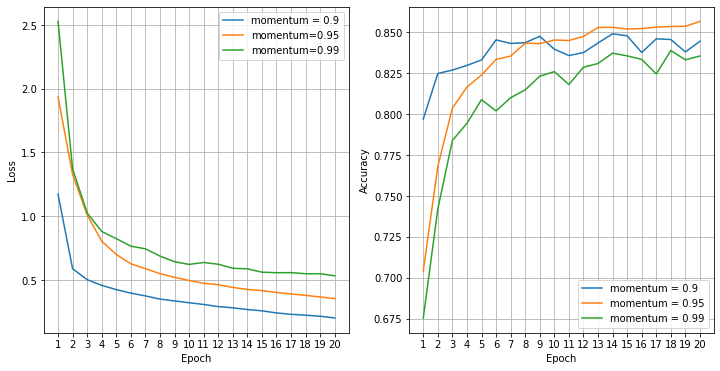

In [23]:
#plot the result using different momentum rate
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.plot(range(1,epochs+1), loss_list_CNN_dropout3[0], label = 'momentum = 0.9')
plt.plot(range(1,epochs+1), loss_list_CNN_momentum2[0], label = 'momentum=0.95')
plt.plot(range(1,epochs+1), loss_list_CNN_momentum3[0], label = 'momentum=0.99')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(range(1,epochs+1), loss_list_CNN_dropout3[1], label = 'momentum = 0.9')
plt.plot(range(1,epochs+1), loss_list_CNN_momentum2[1], label = 'momentum = 0.95')
plt.plot(range(1,epochs+1), loss_list_CNN_momentum3[1], label = 'momentum = 0.99')

plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

# **7. Test the test set on the Best Model**

In [13]:
#Tune the best parameters for CNN model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

#load train, validation and test data, with 128 as the batch size
batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#build best model by calling CNN_3linear architecture 
best_model = CNN_3linear(in_channels, num_classes, dropout=0.70).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(best_model.parameters(), lr=learning_rate, momentum=0.95, weight_decay=0.0001)

#call train function to test the valid_loader using best model
loss_list_best_model_train= train(best_model, epochs, criterion, optimizer, all_train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.806, Acc: 74.97%, Precision: 0.750, Recall: 0.750

Epoch: 2
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.213, Acc: 79.65%, Precision: 0.797, Recall: 0.797

Epoch: 3
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.844, Acc: 82.37%, Precision: 0.824, Recall: 0.824

Epoch: 4
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.691, Acc: 83.66%, Precision: 0.837, Recall: 0.837

Epoch: 5
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.611, Acc: 84.77%, Precision: 0.848, Recall: 0.848

Epoch: 6
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.558, Acc: 85.60%, Precision: 0.856, Recall: 0.856

Epoch: 7
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.522, Acc: 86.33%, Precision: 0.863, Recall: 0.863

Epoch: 8
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.496, Acc: 86.54%, Precision: 0.865, Recall: 0.865

Epoch: 9
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.469, Acc: 86.65%, Precision: 0.866, Recall: 0.866

Epoch: 10
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.448, Acc: 86.51%, Precision: 0.865, Recall: 0.865

Epoch: 11
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.427, Acc: 87.55%, Precision: 0.875, Recall: 0.875

Epoch: 12
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.411, Acc: 87.48%, Precision: 0.875, Recall: 0.875

Epoch: 13
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.397, Acc: 87.67%, Precision: 0.877, Recall: 0.877

Epoch: 14
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.386, Acc: 88.53%, Precision: 0.885, Recall: 0.885

Epoch: 15
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.373, Acc: 88.37%, Precision: 0.884, Recall: 0.884

Epoch: 16
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.368, Acc: 88.73%, Precision: 0.887, Recall: 0.887

Epoch: 17
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.354, Acc: 89.18%, Precision: 0.892, Recall: 0.892

Epoch: 18
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.348, Acc: 89.53%, Precision: 0.895, Recall: 0.895

Epoch: 19
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.335, Acc: 89.73%, Precision: 0.897, Recall: 0.897

Epoch: 20
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.328, Acc: 89.59%, Precision: 0.896, Recall: 0.896



In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

best_model = CNN_3linear(in_channels, num_classes, dropout=0.70).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(best_model.parameters(), lr=learning_rate, momentum=0.95, weight_decay=0.0001)

#call train function to test the test_loader using best model
loss_list_best_model_test= train(best_model, epochs, criterion, optimizer, all_train_loader, test_loader, device)

Epoch: 1
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 1.810, Acc: 75.88%, Precision: 0.759, Recall: 0.759

Epoch: 2
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 1.190, Acc: 79.74%, Precision: 0.797, Recall: 0.797

Epoch: 3
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.817, Acc: 82.90%, Precision: 0.829, Recall: 0.829

Epoch: 4
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.678, Acc: 83.32%, Precision: 0.833, Recall: 0.833

Epoch: 5
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.605, Acc: 83.98%, Precision: 0.840, Recall: 0.840

Epoch: 6
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.550, Acc: 84.70%, Precision: 0.847, Recall: 0.847

Epoch: 7
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.515, Acc: 84.36%, Precision: 0.844, Recall: 0.844

Epoch: 8
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.490, Acc: 85.26%, Precision: 0.853, Recall: 0.853

Epoch: 9
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.466, Acc: 85.34%, Precision: 0.853, Recall: 0.853

Epoch: 10
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.443, Acc: 85.39%, Precision: 0.854, Recall: 0.854

Epoch: 11
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.427, Acc: 85.51%, Precision: 0.855, Recall: 0.855

Epoch: 12
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.415, Acc: 85.39%, Precision: 0.854, Recall: 0.854

Epoch: 13
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.399, Acc: 85.98%, Precision: 0.860, Recall: 0.860

Epoch: 14
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.389, Acc: 85.81%, Precision: 0.858, Recall: 0.858

Epoch: 15
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.375, Acc: 85.77%, Precision: 0.858, Recall: 0.858

Epoch: 16
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.370, Acc: 85.92%, Precision: 0.859, Recall: 0.859

Epoch: 17
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.355, Acc: 85.86%, Precision: 0.859, Recall: 0.859

Epoch: 18
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.348, Acc: 86.02%, Precision: 0.860, Recall: 0.860

Epoch: 19
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.335, Acc: 85.82%, Precision: 0.858, Recall: 0.858

Epoch: 20
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/391 [00:00<?, ?it/s]

Loss: 0.326, Acc: 85.76%, Precision: 0.858, Recall: 0.858



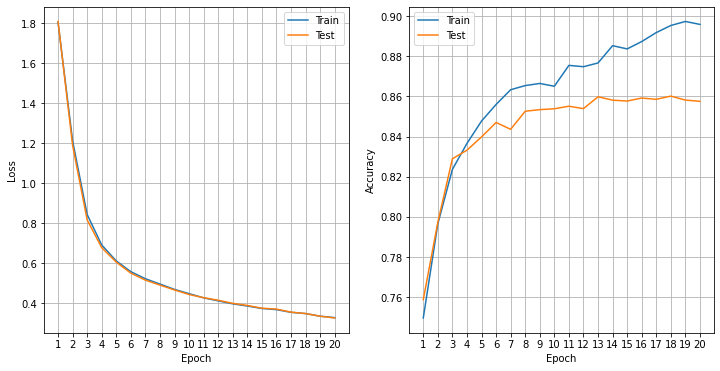

In [15]:
#plot train valid set and test set results using the best model
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)

plt.plot(range(1,epochs+1), loss_list_best_model_train[0], label = 'Train')
plt.plot(range(1,epochs+1), loss_list_best_model_test[0], label = 'Test')
plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1,2,2)

plt.plot(range(1,epochs+1), loss_list_best_model_train[1], label = 'Train')
plt.plot(range(1,epochs+1), loss_list_best_model_test[1], label = 'Test')

plt.legend()
plt.grid(True)
plt.xticks(range(1,epochs+1), range(1,epochs+1))
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

# 8. Run the Best Model

In [ ]:
#define an evaluation funtion 
def train(model, epochs, criterion, optimizer, train_loader, valid_loader, device):

#evaluation metrics: loss, accuracy, precision and recall
  loss_list = []
  acc_list = []
  precision_list=[]
  recall_list=[]

  for epoch in range(epochs):
    print(f'Epoch: {epoch+1}')

    model.train()
    running_loss = 0
    print("Training:", end='')
    
    #use the tqdm library to read image and label
    for image, label in tqdm(train_loader, total=len(train_loader)):
      
      image = image.to(device).to(torch.float32)
      label = label.to(device).view(-1)
    #clean the optimizer
      optimizer.zero_grad()
      out = model(image)
    #add value to loss list
      loss = criterion(out, label)
      loss.backward()
      optimizer.step()
      running_loss += loss.item()
      
    final_loss = running_loss / len(train_loader)
    loss_list.append(final_loss)
    #add values to accuracy, precision and reall list
    model.eval()
    print("Validation:", end='')
    #test function is defined below
    acc, precision, recall = test(model, valid_loader, device)
    acc_list.append(acc)
    precision_list.append(precision)
    recall_list.append(recall)

    print(f'Loss: {final_loss:.3f}, Acc: {acc*100:.2f}%, Precision: {precision:.3f}, Recall: {recall:.3f}\n')

  return loss_list, acc_list,precision_list, recall_list

In [ ]:
def test(model, test_loader, device):
#create y prediction list and ground truth list
  y_pred = []
  gt = []
    #Iterate through the test set minibatchs
  for image, label in tqdm(test_loader, total=len(test_loader)):
      
      image = image.to(device).to(torch.float32)
      label = label.to(device).view(-1)
      
      out = model(image)
    #predict y labels in test dataset
      predicted = torch.argmax(out, -1)
      y_pred.extend(list(predicted.cpu().numpy()))
      gt.extend(list(label.cpu().numpy()))

  #calculate accuracy score, precision score and recall score compare with ground truth labels.
  acc = accuracy_score(y_pred, gt)
  precision = precision_score(y_pred, gt, average='micro')
  recall = recall_score(y_pred, gt, average='micro')

  return acc, precision, recall

In [ ]:
#Best model Structure
class CNN_3linear(nn.Module):

  def __init__(self, in_channels, num_classes, dropout=0.2):
    super(CNN_3linear, self).__init__()
    self.features = nn.Sequential(
            nn.Conv2d(in_channels, 3, kernel_size=3, padding=1), #convolutional layer 1: out channels = 3, kernel size = 3, padding =1
            nn.BatchNorm2d(3),
            nn.ReLU(True),
            nn.Conv2d(3, 64, kernel_size=3, padding=1), #convolutional layer 2: out channels = 64 kernel size = 3, padding =1
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),  #using max polling to extract features with kernel size 2, reducing from 28*28 to 14*14
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, padding=1), #convolutional layer 1: out channels = 256, kernel size = 3, padding =1
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2)  #using max polling to further extract features with kernel size 2, reducing from 14*14 to 7*7
        )
    #add three fully connected layers
    self.classifier = nn.Sequential(
            nn.Linear(256 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, num_classes)
        )

    #forward function that defines network structure
  def forward(self, x):
    x = self.features(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

In [18]:
#the best parameters for CNN model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

in_channels = train_images.shape[1]
num_classes = len(np.unique(train_label))
learning_rate = 0.01
epochs = 20

batch_size = 128
all_train_loader = DataLoader(dataset=all_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

best_model = CNN_3linear(in_channels, num_classes, dropout=0.70).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(best_model.parameters(), lr=learning_rate, momentum=0.95, weight_decay=0.0001)

loss_list_best_model_train= train(best_model, epochs, criterion, optimizer, all_train_loader, valid_loader, device)

Epoch: 1
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.745, Acc: 74.47%, Precision: 0.745, Recall: 0.745

Epoch: 2
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 1.108, Acc: 80.85%, Precision: 0.808, Recall: 0.808

Epoch: 3
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.786, Acc: 82.69%, Precision: 0.827, Recall: 0.827

Epoch: 4
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.671, Acc: 84.16%, Precision: 0.842, Recall: 0.842

Epoch: 5
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.600, Acc: 85.22%, Precision: 0.852, Recall: 0.852

Epoch: 6
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.550, Acc: 85.23%, Precision: 0.852, Recall: 0.852

Epoch: 7
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.517, Acc: 86.22%, Precision: 0.862, Recall: 0.862

Epoch: 8
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.494, Acc: 86.63%, Precision: 0.866, Recall: 0.866

Epoch: 9
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.468, Acc: 86.89%, Precision: 0.869, Recall: 0.869

Epoch: 10
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.449, Acc: 87.35%, Precision: 0.873, Recall: 0.873

Epoch: 11
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.434, Acc: 87.57%, Precision: 0.876, Recall: 0.876

Epoch: 12
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.418, Acc: 88.04%, Precision: 0.880, Recall: 0.880

Epoch: 13
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.402, Acc: 87.83%, Precision: 0.878, Recall: 0.878

Epoch: 14
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.391, Acc: 87.73%, Precision: 0.877, Recall: 0.877

Epoch: 15
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.379, Acc: 88.37%, Precision: 0.884, Recall: 0.884

Epoch: 16
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.368, Acc: 88.84%, Precision: 0.888, Recall: 0.888

Epoch: 17
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.359, Acc: 88.37%, Precision: 0.884, Recall: 0.884

Epoch: 18
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.352, Acc: 89.44%, Precision: 0.894, Recall: 0.894

Epoch: 19
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.340, Acc: 88.95%, Precision: 0.889, Recall: 0.889

Epoch: 20
Training:

  0%|          | 0/391 [00:00<?, ?it/s]

Validation:

  0%|          | 0/118 [00:00<?, ?it/s]

Loss: 0.332, Acc: 89.28%, Precision: 0.893, Recall: 0.893



In [19]:
#get the final result for test data
acc, precision, recall = test(best_model, test_loader, device)
print(f'Acc: {acc*100:.2f}%, Precision: {precision:.3f}, Recall: {recall:.3f}\n')

  0%|          | 0/391 [00:00<?, ?it/s]

Acc: 86.16%, Precision: 0.862, Recall: 0.862



In [21]:
#check the summary structure of our best model
from torchsummary import summary
summary(best_model, input_size=(1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 3, 28, 28]              30
       BatchNorm2d-2            [-1, 3, 28, 28]               6
              ReLU-3            [-1, 3, 28, 28]               0
            Conv2d-4           [-1, 64, 28, 28]           1,792
       BatchNorm2d-5           [-1, 64, 28, 28]             128
              ReLU-6           [-1, 64, 28, 28]               0
         MaxPool2d-7           [-1, 64, 14, 14]               0
            Conv2d-8          [-1, 128, 14, 14]          73,856
       BatchNorm2d-9          [-1, 128, 14, 14]             256
             ReLU-10          [-1, 128, 14, 14]               0
           Conv2d-11          [-1, 256, 14, 14]         295,168
      BatchNorm2d-12          [-1, 256, 14, 14]             512
             ReLU-13          [-1, 256, 14, 14]               0
        MaxPool2d-14            [-1, 25

# **9. Save Best Model**

In [ ]:
#save the best model as pt
torch.save(best_model, 'group131_pretrained_model.pt')

# **10. Software Info**

In [16]:
!df -h

Filesystem      Size  Used Avail Use% Mounted on
overlay         167G   39G  128G  24% /
tmpfs            64M     0   64M   0% /dev
shm             5.7G  4.0K  5.7G   1% /dev/shm
/dev/root       2.0G  1.2G  812M  59% /sbin/docker-init
tmpfs           6.4G   36K  6.4G   1% /var/colab
/dev/sda1       174G   42G  132G  25% /opt/bin/.nvidia
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware
drive            15G  8.2G  6.9G  55% /content/drive


In [20]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
address sizes	: 46 bits physical, 48 b

In [19]:
!cat /proc/meminfo

MemTotal:       13298580 kB
MemFree:         2605760 kB
MemAvailable:    9104944 kB
Buffers:          142952 kB
Cached:          5041456 kB
SwapCached:            0 kB
Active:          4188504 kB
Inactive:        6074576 kB
Active(anon):    3565720 kB
Inactive(anon):    16372 kB
Active(file):     622784 kB
Inactive(file):  6058204 kB
Unevictable:           0 kB
Mlocked:               0 kB
SwapTotal:             0 kB
SwapFree:              0 kB
Dirty:               300 kB
Writeback:             0 kB
AnonPages:       5078644 kB
Mapped:          1093812 kB
Shmem:             17092 kB
KReclaimable:     119292 kB
Slab:             182636 kB
SReclaimable:     119292 kB
SUnreclaim:        63344 kB
KernelStack:        6096 kB
PageTables:        29204 kB
NFS_Unstable:          0 kB
Bounce:                0 kB
WritebackTmp:          0 kB
CommitLimit:     6649288 kB
Committed_AS:    7902948 kB
VmallocTotal:   34359738367 kB
VmallocUsed:       48960 kB
VmallocChunk:          0 kB
Percpu:          